# Artifical Neural Networks
### Basic introduction to Artifical Neural Networks
by: *Màtè Benedek Jordàn* and *Moritz Theis*, Duale Hochschule Baden Württemberg, Heilbronn, Germany, May 2022


### Table of contents

- Introduction
- The goal of our ANN - Recognition of handwritten digits
- Importing libraries
1. The MNIST - Dataset (mnist.pkl.gz)
2. Expanding the Dataset (mnist_expanded1.pkl.gz)
3. Loading the Data
4. Exploring the Dataset
5. Training our Neural Network
6. Evaluation of our model
    - Confusion Matrix
    - Learning curve
7. Optimization
8. Conclusion

### Introduction to ANN
Artifical Neural Networks/AI is getting a lot of press nowadays, some saying it will save the world, some saying it will doom it. Sadly, it is rarely explained what a Neural Network really is, or how it works. Most of the time it is just a comparison to a human brain.<br />
How does a Neural Network really work? In this notebook we will explore the basic type of an ANN: Feedforward Neural Networks. Read the comments, run the code, modify it where you see fit and you will get a good baseline understanding of the inner workings of an ANN. This notebook can be used in combination with our [Powerpoint](https://shared-assets.adobe.com/link/6ec714f8-4d93-4b51-635e-a8c134baf058).

### The goal of our ANN - Recognition of handwritten digits

We will implement hand written digit recognition: for us humans it is a straight forward task, we have seen numbers more than millions of times, it is as natural as breathing. But have you thought about how interesting it is, that e.g. the handwritten 4 from person A can differ so much from the 4 of person B, and yet we have no trouble telling that they are both fours? <br /> 
Now how will we teach a computer to do the same thing?

Of course this is only a low level implementation, in real life you would find a neural network e.g. a self driving car. 

### Importing libraries

In [1]:
#saving and manipulating data
import pickle
import gzip

import os.path
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import collections
from collections import Counter

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

#visualizing
import seaborn as sns

# ANN model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale

from sklearn.neural_network import MLPClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from sklearn.preprocessing import StandardScaler
# if it throws an error, you might need to upgrade your pip and try again

import time


### The MNIST - Dataset (mnist.pkl.gz)
For the demonstration of our ANN we will be using the MNIST Dataset, which is a collection of handwritten digits - 28x28 pixels. These are labeled with the according correct number.

The MNIST Dataset has been split up into three different datasets, one for training (50.000 entries), one for validation (10.000 entries) and one for testing purposes(10.000 entries). This is a good amount of data, however we can artifically expand this dataset, which we will do later.

These images have been turned into numpy ndarray, where every entry represents a pixel from the 28x28 picture of the handwritten number. The value of these floats ranges from a 0 (a completly dark pixel), to a 1 (a fully white pixel).<br />

training_data[0] contains two entries: training_data[0][0] contains the input images as arrays, training_data[0][1] contains the corresponding numbers as an integer, which ideally should be the output of our model.

 If you want more background information on the dataset click [here](http://yann.lecun.com/exdb/mnist/)(altough ours is slightly differently split up, it has the same content). <br />
 

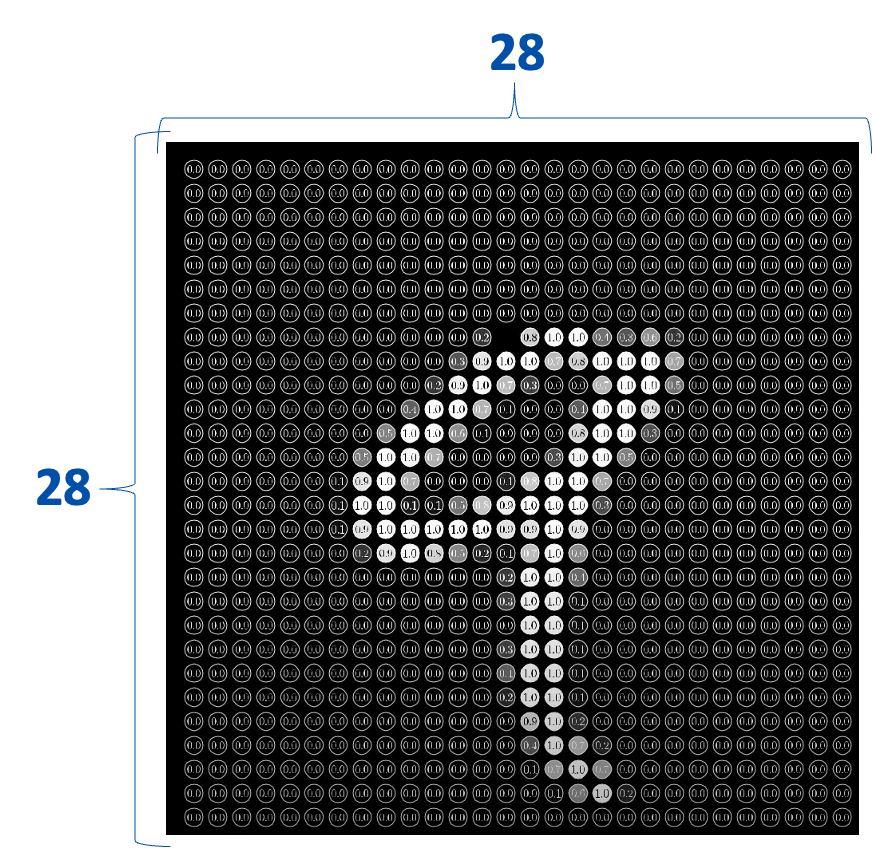

### Expanding the Dataset (mnist_expanded1.pkl.gz)
More data is better! (Most of the time.) This step moves all (active)pixels of a particular number up, down, right or left. For humans this distinction is almost unnoticable because the shape still stays the same, but for a Neural Network it is quite a piece of work to still recognize the shapes, altough different neurons are getting activated. The original dataset is split into three parts, training, test, however we join them into one big dataset after expanding them. 

One could argue that this is "cheating" because the model has probably already seen every number before testing, but slightly shifted to a side. We know that there is a risk of [overfitting](https://elitedatascience.com/overfitting-in-machine-learning) here, but we still think it is more important to really recognise the shapes instead of the places where a number is written. If you would use this model in a hand written digit recognition tool, you would need to make less of an effort centering the input, because the model is used to it.

If you dont agree, you can use the second option where you use the original dataset. This is implemented in the notebook too.

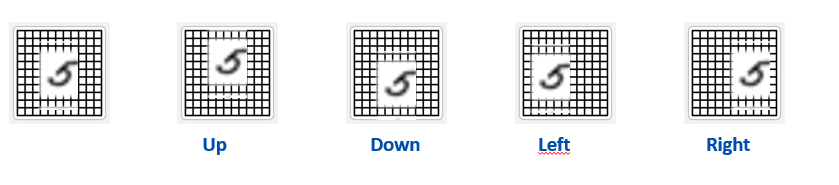

In [2]:
expanded_training_pairs = []
def shift(pixels, number):
    #shifts every number to 
    j=0
    for x, y in zip(pixels, number):
        #adds the original dataset
        expanded_training_pairs.append((x, y))
        image = np.reshape(x, (-1, 28))
        j += 1
        if j % 1000 == 0: print("Expanding image number", j)
        # iterates over data telling us the details of how many images 
        # were displaced / what image number was displaced (to another position)
        for shift, axis, index_position, index in [
                (1,  0, "first", 0), #up
                (-1, 0, "first", 27), #down
                (1,  1, "last",  0), #right
                (-1, 1, "last",  27)]:#left
            new_img = np.roll(image, shift, axis) #shifting the digit
            if index_position == "first": 
                new_img[index, :] = np.zeros(28)
            else:
                new_img[:, index] = np.zeros(28)
            #adding the new picture to the new dataset
            expanded_training_pairs.append((np.reshape(new_img, 784), y))




#Expanding the Dataset
#If the expanded dataset already exists the programm stops

if os.path.exists('mnist_expanded1.pkl.gz'):
    print("The expanded training set already exists")
else:
    f = gzip.open('mnist.pkl.gz', 'rb')
    u = pickle._Unpickler( f )
    u.encoding = 'latin1'
    training_data, validation_data, test_data = u.load()
    f.close()
    
    j = 0 # counter
    shift(training_data[0], training_data[1])
    shift(test_data[0],test_data[1])
    shift(validation_data[0],validation_data[1])
    random.shuffle(expanded_training_pairs)
    expanded_training_data = [list(shift) for shift in zip(*expanded_training_pairs)]
    print("Saving expanded data. This may take a few minutes.") 
    f = gzip.open('mnist_expanded1.pkl.gz', "w")
    pickle.dump((expanded_training_data), f)
    f.close()
print ("Finished")

The expanded training set already exists
Finished


# Loading the Data

In [3]:
def load_data():
    #loads the expanded dataset
    f = gzip.open('mnist_expanded1.pkl.gz', 'rb')
    training_data = pickle.load(f, encoding="latin1")
    f.close()
    return (training_data)

In [4]:
def load_small_model_data():
    #loads the expanded dataset
    f = gzip.open('mnist.pkl.gz', 'rb')
    training_data, test_data, val_data = pickle.load(f, encoding="latin1")
    f.close()
    return (training_data, test_data, val_data)

In [5]:
small_model_data, test, val = load_small_model_data()

In [6]:
#concetanating the original dataset
images = np.concatenate([test[0], val[0], small_model_data[0]], axis=0)
numbers = np.concatenate([test[1], val[1], small_model_data[1]], axis=0)

In [7]:
#loading the expanded dataset
training_data = load_data() 

## Exploring the Datasets


Number of entries in the expanded dataset

In [10]:
len(training_data[0])

350000

In [12]:
#the first 15 numbers
training_data[1][0:15]

[1, 0, 1, 8, 4, 6, 1, 2, 5, 1, 5, 6, 6, 8, 8]

#### Distribution of numbers in the dataset 

As we can see the distribution of the different numbers is not bad, altough not optimal. There is a lot less fives than ones in the data. In a perfect dataset we would have the same amount of every possible output.


In [11]:
# distribution of numbers
dist = Counter(training_data[1])
od = collections.OrderedDict(sorted(dist.items()))
od

OrderedDict([(0, 34515),
             (1, 39385),
             (2, 34950),
             (3, 35705),
             (4, 34120),
             (5, 31565),
             (6, 34380),
             (7, 36465),
             (8, 34125),
             (9, 34790)])

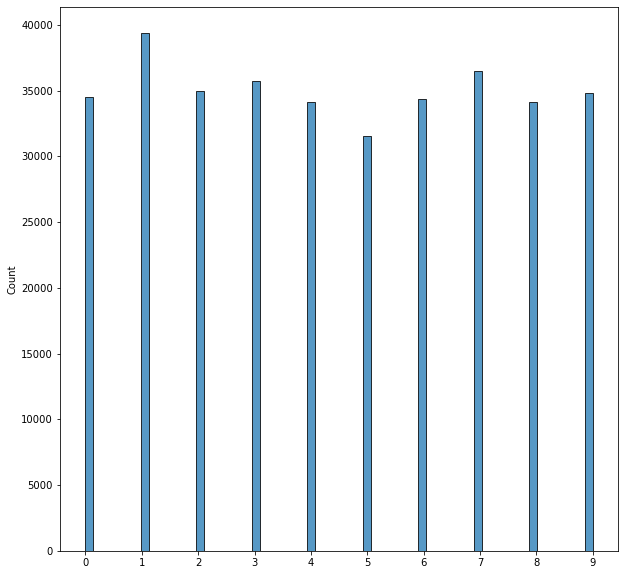

In [12]:
#distribution of numbers

fig, ax = plt.subplots(figsize=(10, 10))
  
# drawing the plot
sns.histplot(training_data[1], ax=ax)
plt.xticks(np.arange(10))
plt.show()

#### Undersampling 

To achieve an equal amount of each number, we will [undersample](https://towardsdatascience.com/oversampling-and-undersampling-5e2bbaf56dcf) the data. This method deletes random instances from every bar(except 5), until it is the same height as the rarest number(5).

In our case this is possible, because we have a lot of data. If you have less data, you have to be careful using this technique, because you might accidentally reduce your accuracy by deleting important data.

Another option would be to oversample, duplicate random instances in the lower columns until they are the height of the highest one.

Here you have to watch out, there is a possibility of overfitting because of the duplicates.

In [15]:
print(Counter(training_data[1]))

Counter({1: 39385, 7: 36465, 3: 35705, 2: 34950, 9: 34790, 0: 34515, 6: 34380, 8: 34125, 4: 34120, 5: 31565})


In [16]:
training_data[0]

[array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

In [40]:
rus = RandomUnderSampler()

In [41]:
X_rus, y_rus = rus.fit_resample(training_data[0], training_data[1])

In [35]:
test = np.array(X_rus)

In [43]:
len(test)

350000

In [13]:
# instantiating the random undersampler for the expanded dataset. you can skip this step to use the expanded dataset as it is. 
if os.path.exists('undersampled_data.plz.gz'):
    print("The undersampled training set already exists")
else:
    print("Undersampling data. This may take a few minutes.")
    rus = RandomUnderSampler() 
    # resampling X, y
    X_rus, y_rus = rus.fit_resample(training_data[0], training_data[1])
    # new class distribution
    print(len(X_rus))
    X_rus = np.array(X_rus)
    print(len(X_rus))
    print(Counter(y_rus))
    f = gzip.open('undersampled_data.plz.gz', "w")
    print("Saving undersampled data. This may take a few minutes.")
    pickle.dump((X_rus, y_rus), f)    
    f.close()
    print("done")

Undersampling data. This may take a few minutes.
315650
315650
Counter({0: 31565, 1: 31565, 2: 31565, 3: 31565, 4: 31565, 5: 31565, 6: 31565, 7: 31565, 8: 31565, 9: 31565})
Saving undersampled data. This may take a few minutes.
done


In [18]:
if os.path.exists('undersampled_data_original.plz.gz'):
    print("The undersampled training set already exists")
else:
    print("Undersampling data. This may take a few minutes.")
    rus = RandomUnderSampler() 
    # resampling X, y
    X_rus, y_rus = rus.fit_resample(images, numbers)
    # new class distribution
    X_rus = np.array(X_rus)
    print(Counter(y_rus))
    f = gzip.open('undersampled_data_original.plz.gz', "w")
    print("Saving undersampled data. This may take a few minutes.")
    pickle.dump((X_rus, y_rus), f)    
    f.close()
    print("Done")

Undersampling data. This may take a few minutes.
Counter({0: 6313, 1: 6313, 2: 6313, 3: 6313, 4: 6313, 5: 6313, 6: 6313, 7: 6313, 8: 6313, 9: 6313})
Saving undersampled data. This may take a few minutes.
Done


In [14]:
def load_undersampled_expanded():
    #loads the undersampled expanded dataset
    f = gzip.open('undersampled_data.plz.gz', 'rb')
    X_rus, y_rus = pickle.load(f, encoding="latin1")
    f.close()
    return (X_rus, y_rus)
def load_undersampled_original():
    #loads the undersampled expanded dataset
    f = gzip.open('undersampled_data_original.plz.gz', 'rb')
    X_rus_o, y_rus_o = pickle.load(f, encoding="latin1")
    f.close()
    return (X_rus_o, y_rus_o)

In [20]:
#loading the undersampled expanded dataset, if you want, you can use it in the model without undersampling too.
X_rus, y_rus = load_undersampled_expanded()

In [16]:
X_rus_orig, y_rus_orig = load_undersampled_original()

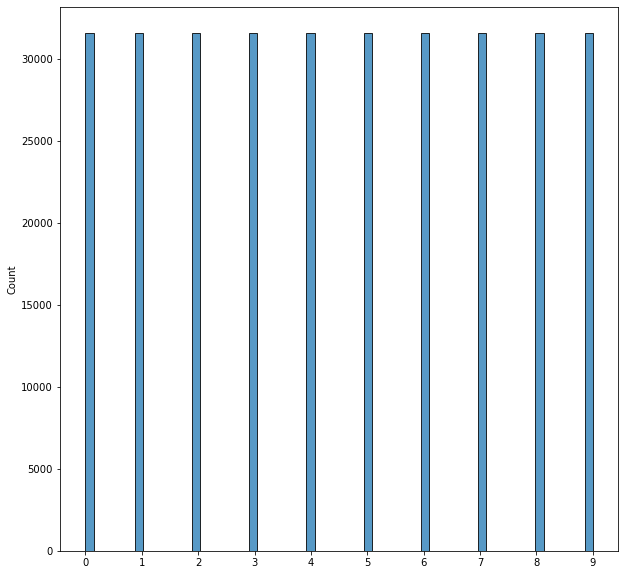

In [68]:
#distribution of numbers in the undersampled dataset

fig, ax = plt.subplots(figsize=(10, 10))
  
# drawing the plot
sns.histplot(y_rus, ax=ax)
plt.xticks(np.arange(10))
plt.show()

In [21]:
len(X_rus)

315650

In [18]:
len(X_rus_orig)

63130

This is how the first input looks, 784 floats in an array:

In [ ]:
training_data[0][0][1]

This is the number it represents:

In [ ]:
training_data[0][1][1]

**Data without expandation**: 

50.000 (training_data) + 10.000 (validation_data) + 10.000 (test_data)


**Expanded and undersampled Data**:

50.000 Training Data + 50.000 (images up) + 50.000 (images down) + 50.000 (images right) + 50.000 (images left) + 10.000 Test Data + 10.000 * 4 (images up, down, right, left)                                                  + 10.000 Validation Data + 10.000 * 4 (images up down, right, left)

- 350.000 different digits

- Undersampled: 315.650
 

## Training our Neural Network 

#### MLP (Multi-Layered-Perceptron Classifier)
We have expanded the dataset, slightly restructured it, now we can train a model. We will be using the MLPClassifier, because it is easy to use and intuitive. In its simplest form you give it data it should base its decision on, you give the correct outputs, you set a training_size and test_size (how much of the data it should use to train and test).

It outputs the different iterations, loss of each iteration and the accuracy of the prediction.  

The default properties of the neural network created with the `sklearn.neural_network.MLPClassifier` are:
* Size of the input layer depends on the number of features in X
* A hidden layer consisting of 100 units
* ReLu activation fuction
* Adam optimizer
* Constant learning rate of 0.001
* 200 iterations at maximum, aitomatic stopping when the optimizer made improvement of less than `tol` on two consecutive iterations.
* No early stopping

You can find more hyperparamter options [here](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html) 

------

#### Testing with the original Dataset (MLP1 + MLP2)

**MLP1**: Training & Testing with sampled dataset (70.000 images), 16 x 16 Layers

In [74]:
#Neural Network with the same number of layers and neurons (as 3Blue1Brown)

start = time.perf_counter() #calculating the time the model needed

X_train, X_test, y_train, y_test = train_test_split(images, numbers,  test_size=0.2, 
random_state=1)
mlp1 = MLPClassifier(activation = "relu", verbose=True, hidden_layer_sizes=(16,16)) #max_iter = 150 # 2 Layer (16, 16 Neuronen)

mlp1.fit(X_train, y_train)

print('Training set score: {:.3f}'.format(mlp1.score(X_train, y_train)))
print('Test set score: {:.3f}'.format(mlp1.score(X_test, y_test)))
end = time.perf_counter()

print("Calculation for this model took: "+str((end - start)/60) + "minutes")

Iteration 1, loss = 0.86506933
Iteration 2, loss = 0.29953913
Iteration 3, loss = 0.24790006
Iteration 4, loss = 0.22326761
Iteration 5, loss = 0.20736602
Iteration 6, loss = 0.19451197
Iteration 7, loss = 0.18360402
Iteration 8, loss = 0.17533188
Iteration 9, loss = 0.16907065
Iteration 10, loss = 0.16260822
Iteration 11, loss = 0.15643587
Iteration 12, loss = 0.15282443
Iteration 13, loss = 0.14754259
Iteration 14, loss = 0.14407142
Iteration 15, loss = 0.14097878
Iteration 16, loss = 0.13812574
Iteration 17, loss = 0.13377385
Iteration 18, loss = 0.13140609
Iteration 19, loss = 0.12784572
Iteration 20, loss = 0.12591006
Iteration 21, loss = 0.12388527
Iteration 22, loss = 0.12108721
Iteration 23, loss = 0.11912733
Iteration 24, loss = 0.11642059
Iteration 25, loss = 0.11443779
Iteration 26, loss = 0.11316278
Iteration 27, loss = 0.11195179
Iteration 28, loss = 0.10906560
Iteration 29, loss = 0.10734319
Iteration 30, loss = 0.10742695
Iteration 31, loss = 0.10515175
Iteration 32, los

C:\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Test set score: **0.946**

Time for processing is low because of 2 layers with 16 neurons each

**MLP2**: Training & Testing with sampled dataset (70.000 images), 100 x 50 x 25 Layers

In [71]:
start = time.perf_counter() #calculating the time the model needed

X_train, X_test, y_train, y_test = train_test_split(images, numbers,  test_size=0.2, 
random_state=1)
mlp2 = MLPClassifier(activation = "relu", verbose=True,
                    hidden_layer_sizes =(100,50,25), learning_rate = "adaptive") #100, 50, 25 Neuronen im Hidden Layer

mlp2.fit(X_train, y_train)

print('Training set score: {:.3f}'.format(mlp2.score(X_train, y_train)))
print('Test set score: {:.3f}'.format(mlp2.score(X_test, y_test)))
end = time.perf_counter()

print("Calculation for this model took: "+str((end - start)/60) + "minutes")

Iteration 1, loss = 0.49015208
Iteration 2, loss = 0.17236745
Iteration 3, loss = 0.12394873
Iteration 4, loss = 0.09982209
Iteration 5, loss = 0.07894330
Iteration 6, loss = 0.06702605
Iteration 7, loss = 0.05647095
Iteration 8, loss = 0.04891064
Iteration 9, loss = 0.04020050
Iteration 10, loss = 0.03781704
Iteration 11, loss = 0.03176436
Iteration 12, loss = 0.02702633
Iteration 13, loss = 0.02256009
Iteration 14, loss = 0.02250945
Iteration 15, loss = 0.01902926
Iteration 16, loss = 0.01479468
Iteration 17, loss = 0.01400271
Iteration 18, loss = 0.01252145
Iteration 19, loss = 0.01462090
Iteration 20, loss = 0.01330753
Iteration 21, loss = 0.01066394
Iteration 22, loss = 0.00985634
Iteration 23, loss = 0.01069038
Iteration 24, loss = 0.01272833
Iteration 25, loss = 0.00725383
Iteration 26, loss = 0.00542230
Iteration 27, loss = 0.00573110
Iteration 28, loss = 0.00422080
Iteration 29, loss = 0.01267945
Iteration 30, loss = 0.01264398
Iteration 31, loss = 0.00754794
Iteration 32, los

Test set score of **0.978**

#### Testing with the expanded, undersampled Dataset (MLP3 + MLP4)

**MLP3**:Training & Testing with expanded, undersampled Data (315.650 images), 16 x 16 Layer

In [75]:
#Neural Network with the same number of layers and neurons (as 3Blue1Brown)

start = time.perf_counter() #calculating the time the model needed

X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus,  test_size=0.2, 
random_state=1)
mlp3 = MLPClassifier(activation = "relu", verbose=True, hidden_layer_sizes=(16,16), learning_rate = 'adaptive') #max_iter = 150 # 2 Layer (16, 16 Neuronen)

mlp3.fit(X_train, y_train)

print('Training set score: {:.3f}'.format(mlp3.score(X_train, y_train)))
print('Test set score: {:.3f}'.format(mlp3.score(X_test, y_test)))
end = time.perf_counter()

print("Calculation for this model took: "+str((end - start)/60) + "minutes")

Iteration 1, loss = 0.50772590
Iteration 2, loss = 0.28627794
Iteration 3, loss = 0.24202057
Iteration 4, loss = 0.21575855
Iteration 5, loss = 0.19923768
Iteration 6, loss = 0.18812827
Iteration 7, loss = 0.18074203
Iteration 8, loss = 0.17419550
Iteration 9, loss = 0.16988701
Iteration 10, loss = 0.16574378
Iteration 11, loss = 0.16164986
Iteration 12, loss = 0.15834319
Iteration 13, loss = 0.15526743
Iteration 14, loss = 0.15262116
Iteration 15, loss = 0.15047167
Iteration 16, loss = 0.14819593
Iteration 17, loss = 0.14614162
Iteration 18, loss = 0.14401380
Iteration 19, loss = 0.14205343
Iteration 20, loss = 0.14114290
Iteration 21, loss = 0.14010630
Iteration 22, loss = 0.13821666
Iteration 23, loss = 0.13716398
Iteration 24, loss = 0.13575649
Iteration 25, loss = 0.13434306
Iteration 26, loss = 0.13337537
Iteration 27, loss = 0.13226064
Iteration 28, loss = 0.13135076
Iteration 29, loss = 0.13053351
Iteration 30, loss = 0.12983693
Iteration 31, loss = 0.12849405
Iteration 32, los

Accuracy of **0.944** --> OK but improvable

almost the same result with same number of layer (16 x 16) --> undersampling made no real improvement

The reason for the error message is that the model took too many iterations to train. We could extend the max number of iterations, but we can already see that we wont get results which are as good as our model with more layers.

**MLP4** :Training & Testing with expanded, undersampled Data (315.650 images), 100 x 50 x 25 Layer

In [76]:
#start = time.perf_counter() #calculating the time the model needed

X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus,  test_size=0.2, 
random_state=1)
mlp4 = MLPClassifier(activation = "relu", verbose=True,
                    hidden_layer_sizes =(100,50,25), learning_rate = "adaptive") #100, 50, 25 Neuronen im Hidden Layer

mlp4.fit(X_train, y_train)

print('Training set score: {:.3f}'.format(mlp4.score(X_train, y_train)))
print('Test set score: {:.3f}'.format(mlp4.score(X_test, y_test)))
#end = time.perf_counter()

#print("Calculation for this model took: "+str((end - start)/60) + "minutes")

Iteration 1, loss = 0.25519175
Iteration 2, loss = 0.09418190
Iteration 3, loss = 0.06923210
Iteration 4, loss = 0.05508119
Iteration 5, loss = 0.04592782
Iteration 6, loss = 0.03958533
Iteration 7, loss = 0.03391907
Iteration 8, loss = 0.02958163
Iteration 9, loss = 0.02663094
Iteration 10, loss = 0.02320494
Iteration 11, loss = 0.02214512
Iteration 12, loss = 0.02023445
Iteration 13, loss = 0.01844637
Iteration 14, loss = 0.01699913
Iteration 15, loss = 0.01635315
Iteration 16, loss = 0.01467842
Iteration 17, loss = 0.01355394
Iteration 18, loss = 0.01366307
Iteration 19, loss = 0.01257597
Iteration 20, loss = 0.01170387
Iteration 21, loss = 0.01079959
Iteration 22, loss = 0.01127232
Iteration 23, loss = 0.00963609
Iteration 24, loss = 0.01157737
Iteration 25, loss = 0.01000874
Iteration 26, loss = 0.00991004
Iteration 27, loss = 0.00931295
Iteration 28, loss = 0.00975340
Iteration 29, loss = 0.00789405
Iteration 30, loss = 0.00850214
Iteration 31, loss = 0.00835020
Iteration 32, los

Test Score / Accuracy of **0.987** --> Really good!

The test set score is 0.009 higher

No real improvement is recognizable (between 70.000 images and 315.650). Nevertheless, it is an improvement and the test set score of both (with 100 x 50 x 25) is really high!

As you can see, we tried different numbers of layers and neurons (much more than you can see) but at the end 100,50,25 gives us the highest accuracy. There is probably another distribution where the number of layers and neurons is higher or lower and the accuracy is higher. Until now we found no better version.

### What is loss and why is it important? 
Loss is the squared difference between the expected value and the predicted value of our model in a particular iteration. With the help of [backpropagation](https://de.wikipedia.org/wiki/Backpropagation#:~:text=Backpropagation%20oder%20auch%20Backpropagation%20of,Regel%20auf%20mehrschichtige%20Netze%20angewandt), we adjust the weights in the neurons after a batch of data. That is why we already see a significant improvement after a few iterations, because each iteration is made up of several batches which (to a point) improve our model. We start the first iteration with completly random weights and biases, however every iteration after that, we start with the average weights of all the iterations till that point. <br/> 
Now you are maybe asking yourself, if we calculate the average of all iterations anyway, why bother with setting iterations, why dont we just train the model without these stops and calculate the average as we go? With the iterations we can see the improvement of the model, based on the lowering loss value. If the loss value stagnates through 10 iterations, we assume that we have reached a "local minimum" of the model, at which no further (significant) improvement is possible. This way we know when we can stop training the model.<br/>
Generally speaking, we want to have the loss value as low as possible.

Here you can see the optimal weights of mlp2 which got set by the Network 

In [59]:
print("weights between input and first hidden layer:")
print(mlp2.coefs_[0])
print("\nweights between first hidden and second hidden layer:")
print(mlp2.coefs_[1])
print("\nweights between second hidden and  hidden layer:")
print(mlp2.coefs_[2])
print("\nweights between last hidden and output layer:")
print(mlp2.coefs_[3])
print("Bias values for first hidden layer:")
print(mlp2.intercepts_[0])
print("\nBias values for second hidden layer:")
print(mlp2.intercepts_[1])
print("\nBias values for third hidden layer:")
print(mlp2.intercepts_[2])
print("\nBias values for fourth hidden layer:")
print(mlp2.intercepts_[3])

weights between input and first hidden layer:
[[-2.53898219e-315 -2.72779116e-315  1.20925395e-315 ...  3.48643252e-315
   2.40519678e-315 -1.04089410e-315]
 [ 1.77747522e-315 -8.20569348e-316 -1.56596201e-316 ...  3.09685219e-315
  -1.78433374e-315 -1.58451760e-315]
 [-1.58150812e-315 -3.31631223e-315 -9.99166248e-317 ... -2.41084226e-315
   2.47671744e-316 -4.25491377e-315]
 ...
 [ 9.55292808e-016 -1.42887792e-316 -3.52584451e-016 ... -2.88938192e-315
   3.91734255e-016 -4.52535777e-316]
 [ 6.86407689e-316 -9.95071140e-316  8.78462849e-316 ...  2.59631452e-315
  -1.39593590e-315 -3.02787064e-316]
 [-1.11891733e-315  1.08257110e-315 -8.56629268e-316 ...  2.84232041e-315
   4.51835610e-315  4.22117123e-315]]

weights between first hidden and second hidden layer:
[[ 0.50534974 -0.2824065  -0.20962955 ... -0.50283839  0.41252588
   0.45501863]
 [ 0.41139018 -0.32919346  0.37542973 ...  0.02824664 -0.07001076
   0.1867185 ]
 [-0.18902437  0.29000297  0.05985511 ... -0.24648296  0.01105951

In [62]:
mlp2.coefs_[0].shape

(784, 100)

In [63]:
mlp2.coefs_[1].shape

(100, 50)

In [64]:
mlp2.coefs_[2].shape

(50, 25)

In [65]:
mlp2.coefs_[3].shape

(25, 10)

--> The coefficients of the network are of size (784, 100), (100, 50), (50,25), (25,10).

# Evaluation of our best model

## a. Confusion Matrix 

A Confusion matrix is an N x N matrix used for evaluating the performance / accuracy of a classification model. The matrix compares the actual target values (N) with those predicted by the ML-model (N).

In our case we have a 10x10 matrix containing the predicted digits and the actual ones (0 to 9).

Having high numbers in the diagonal means, that the model guessed a lot of numbers correctly. If you look to the other numbers, you can see where the model makes mistakes. 

In our case you can see that we have a high accuracy. The biggest mistakes our model does is that it 


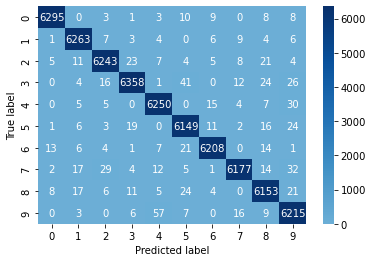

In [82]:
y_pred = mlp4.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, center=True, 
            cmap="Blues", 
            annot=True,  
            xticklabels= np.arange(10), 
            yticklabels= np.arange(10),
            fmt='g')

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [83]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      6337
           1       0.99      0.99      0.99      6303
           2       0.99      0.99      0.99      6331
           3       0.99      0.98      0.99      6482
           4       0.98      0.99      0.99      6316
           5       0.98      0.99      0.98      6231
           6       0.99      0.99      0.99      6275
           7       0.99      0.98      0.99      6293
           8       0.98      0.98      0.98      6249
           9       0.98      0.98      0.98      6313

    accuracy                           0.99     63130
   macro avg       0.99      0.99      0.99     63130
weighted avg       0.99      0.99      0.99     63130



#### Explanation

As you can see above, our model predicts almost every handwritten digit with an accuracy of 0.987. 

- precision: How many numbers did the model classify correctly from all numbers, 1 means it guessed everything correctly, 0 means everything wrong

- recall: How many of the true positives did the modell guess, from 1 to 0

- f1-score: F1 = 2 * (precision * recall) / (precision + recall)

- support: on how many instances (e.g "1") was it tested






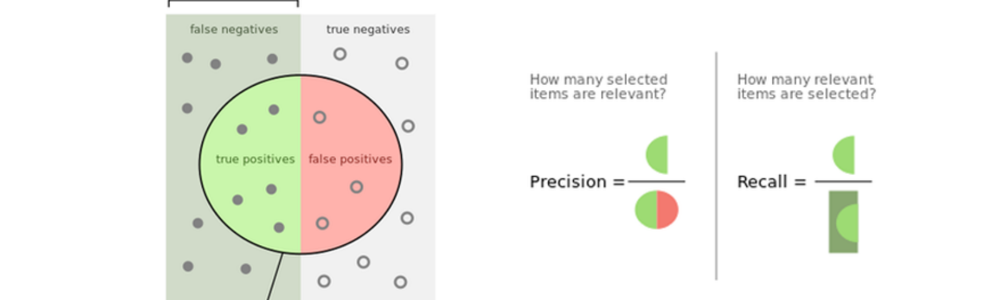

## b. Learning curve

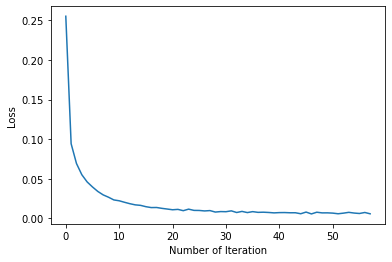

In [84]:
plt.plot(range(len(mlp4.loss_curve_)), mlp4.loss_curve_)
plt.ylabel('Loss')
plt.xlabel('Number of Iteration')
plt.show()

#### Explanation
As you can see in the above linechart, our models loss rate stagnates after a while. The reason behind this is that the local minimums of the different functions in the model have been found and now we are just making very very minor improvements, or bouncing around the minimum, making the model worse and then better again. Or you can imagine it like this.


# Optimization

### Basic Troubleshooting of ANN

Generally speaking, a lower loss value indicates a better model, because it means that it calculates the output of the training rather well, however there are some quirks that may not be obvious from the start.

#### What should i do if my model has...
-   high loss and low accuracy? 
&nbsp;&nbsp;&nbsp;&nbsp; 

Try different [hyperparameters](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html) , you have a lot to choose from! Look at your data again, and see if you can find any reason for the bad performance, like irregularities, or extreme values.
-  low loss and low accuracy? 
&nbsp;&nbsp;&nbsp;&nbsp; 

This is called overfitting the model. This means the model just "memorized" the correct outputs rather than actually trying to pick up on patterns. That is why it performs good on the training set which it knows "by heart", but bad on the test set, which it hasnt seen yet. There are a lot of [solutions](https://elitedatascience.com/overfitting-in-machine-learning) for this, you have to try them and see what helps. The most common solution is to stratify / adjust the splitting of train and test data.
- high loss and high accuracy?

&nbsp;&nbsp;&nbsp;&nbsp; High accuracy is good. The reasoning behind this combination could be that you either have a few datapoints in your training data where the model guesses very wrong, but because the loss is not a percentage, but a sum, you dont really know if your model is generally not very sure of its outputs, or it just messes up badly a few times. High accuracy convinces us of the first hypothesis, namely that the model made a few big mistakes while training, but it is still good. 
- low loss and high accuracy?

&nbsp;&nbsp;&nbsp;&nbsp; You celebrate, you produced a good model.



-----

We optimized the accuracy by the Expandation, the undersampling of the dataset and the changing of hyperparameters of our model                                                      
- with 70.000 Images: 0.978 accuracy
- with 315.650 Images: 0.987 accuracy

-> Not a big improvement but nevertheless it is one

# Conclusion

Our model has a **training test score of 0.999** and an **accuracy of 0.987**. 

The lossrate is on a high level. We first thought that we our model was overfitting but our test rate also stagnates the closer you get to 1. 

Altough the accuracy is not bad, further improvement is very well possible. Try this yourself! You can try a different combination of neurons and layers, you can set the initial learning rate, you can modify how the learning rate changes, different activation and solver functions, etc, etc.
You can find more about possible hyperparamter adjustments in our PP.


------




#### Final words
Thank you again Ruben Nuredini and [3blue1brown](https://www.youtube.com/c/3blue1brown).


Both helped us on the topic (code, explanations, video material).

[This](https://github.com/MichalDanielDobrzanski/DeepLearningPython) Github repo inspired the expanding of the dataset and helped us get a better understanding of the concepts behind an ANN.

 

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=98bfd251-8443-47df-b7c1-16713137a429' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>